# Starter Notebook: Economic Well-Being Prediction Challenge

Welcome! This starter notebook is designed to get you started on this challenge, where you will be attempting to predict a measure of wealth for different locations across Africa. We will take a look at the data, create a model and then use that to make our first submission. After that we will briefly look at some ways to improve. Let's get started.

# Loading the Data

We're using the pandas library to load the data into dataframes - a tabular data structure that is perfect for this kind of work. Each of the three CSV files from Zindi is loaded into a dataframe and we take a look at the shape of the data (number of rows and columns) as well as a preview of the first 5 rows to get a feel for what we're working with.

In [1]:
import os
print (os.environ['CONDA_DEFAULT_ENV'])

tf


In [3]:
%matplotlib inline
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import xgboost as xgb

from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import LabelBinarizer
from sklearn.model_selection import cross_val_score, GridSearchCV

## Read data   

In [7]:
train_df = pd.read_csv('Train.csv')
test_df = pd.read_csv('Test.csv')
print('Train size: ', train_df.shape)
print('Test size: ', test_df.shape)
ID = train_df['ID']

Train size:  (21454, 19)
Test size:  (7194, 18)


In [8]:
train_df.head()

,ID,country,year,urban_or_rural,ghsl_water_surface,ghsl_built_pre_1975,ghsl_built_1975_to_1990,ghsl_built_1990_to_2000,ghsl_built_2000_to_2014,ghsl_not_built_up,ghsl_pop_density,landcover_crops_fraction,landcover_urban_fraction,landcover_water_permanent_10km_fraction,landcover_water_seasonal_10km_fraction,nighttime_lights,dist_to_capital,dist_to_shoreline,Target
0,ID_AAIethGy,Ethiopia,2016,R,0.0,0.000000,0.000000,0.000055,0.000536,0.999408,12.146134,25.489659,0.879484,0.000000,0.000000,0.000000,278.788451,769.338378,0.132783
1,ID_AAYiaCeL,Ethiopia,2005,R,0.0,0.000000,0.000110,0.000000,0.000018,0.999872,113.806716,64.136053,0.601427,0.000000,0.005427,0.000000,200.986978,337.135243,0.004898
2,ID_AAdurmKj,Mozambique,2009,R,0.0,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,4.400096,0.131900,0.000000,0.003078,0.000000,642.594208,169.913773,0.097320
3,ID_AAgNHles,Malawi,2015,R,0.0,0.000141,0.000181,0.000254,0.000228,0.999195,5.213320,25.379371,2.017136,11.293841,0.131035,0.000000,365.349451,613.591610,0.304107
4,ID_AAishfND,Guinea,2012,U,0.0,0.011649,0.017560,0.017383,0.099875,0.853533,31.734661,5.081620,22.815984,0.005047,0.130475,1.461894,222.867189,192.926363,0.605328


In [10]:
train_df.columns

Index(['ID', 'country', 'year', 'urban_or_rural', 'ghsl_water_surface',
       'ghsl_built_pre_1975', 'ghsl_built_1975_to_1990',
       'ghsl_built_1990_to_2000', 'ghsl_built_2000_to_2014',
       'ghsl_not_built_up', 'ghsl_pop_density', 'landcover_crops_fraction',
       'landcover_urban_fraction', 'landcover_water_permanent_10km_fraction',
       'landcover_water_seasonal_10km_fraction', 'nighttime_lights',
       'dist_to_capital', 'dist_to_shoreline', 'Target'],
      dtype='object')

In [12]:
test_df.head()

,ID,country,year,urban_or_rural,ghsl_water_surface,ghsl_built_pre_1975,ghsl_built_1975_to_1990,ghsl_built_1990_to_2000,ghsl_built_2000_to_2014,ghsl_not_built_up,ghsl_pop_density,landcover_crops_fraction,landcover_urban_fraction,landcover_water_permanent_10km_fraction,landcover_water_seasonal_10km_fraction,nighttime_lights,dist_to_capital,dist_to_shoreline
0,ID_AAcismbB,Democratic Republic of Congo,2007,R,0.000000,0.000000,0.000000,0.000523,0.000131,0.999347,0.660758,0.990942,0.132264,0.069055,0.032627,0.000000,1249.294720,1364.592100
1,ID_AAeBMsji,Democratic Republic of Congo,2007,U,0.000000,0.004239,0.000238,0.001227,0.002860,0.991437,6.441547,5.461365,0.452400,0.000000,0.000000,0.000000,821.019579,1046.028681
2,ID_AAjFMjzy,Uganda,2011,U,0.007359,0.525682,0.132795,0.095416,0.042375,0.196373,587.516458,2.881811,87.387991,3.248483,3.950374,60.070041,3.620455,906.057334
3,ID_AAmMOEEC,Burkina Faso,2010,U,0.000000,0.000089,0.000036,0.001519,0.001358,0.996997,35.141762,33.878927,4.166437,0.000000,0.130727,1.333999,109.493969,775.139189
4,ID_ABguzDxp,Zambia,2007,R,0.000000,0.000138,0.000623,0.000615,0.002961,0.995663,3.442449,33.491994,3.437129,0.133563,0.128997,0.502203,133.643319,835.591501


In [14]:
test_df.columns

Index(['ID', 'country', 'year', 'urban_or_rural', 'ghsl_water_surface',
       'ghsl_built_pre_1975', 'ghsl_built_1975_to_1990',
       'ghsl_built_1990_to_2000', 'ghsl_built_2000_to_2014',
       'ghsl_not_built_up', 'ghsl_pop_density', 'landcover_crops_fraction',
       'landcover_urban_fraction', 'landcover_water_permanent_10km_fraction',
       'landcover_water_seasonal_10km_fraction', 'nighttime_lights',
       'dist_to_capital', 'dist_to_shoreline'],
      dtype='object')

In [7]:
ss = pd.read_csv('SampleSubmission.csv')
print(ss.shape)
ss.head()

(7194, 2)


,ID,Target
0,ID_AAcismbB,0
1,ID_AAeBMsji,0
2,ID_AAjFMjzy,0
3,ID_AAmMOEEC,0
4,ID_ABguzDxp,0


# Exploratory Data Analysis

Features meaning/definition:

1. ghsl_water_surface - fraction of land within 5km of the cluster that is classified as water surface.



In [8]:
print('Quick overview of Train data')
train_df.info()

Quick overview of Train data
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21454 entries, 0 to 21453
Data columns (total 19 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   ID                                       21454 non-null  object 
 1   country                                  21454 non-null  object 
 2   year                                     21454 non-null  int64  
 3   urban_or_rural                           21454 non-null  object 
 4   ghsl_water_surface                       21454 non-null  float64
 5   ghsl_built_pre_1975                      21454 non-null  float64
 6   ghsl_built_1975_to_1990                  21454 non-null  float64
 7   ghsl_built_1990_to_2000                  21454 non-null  float64
 8   ghsl_built_2000_to_2014                  21454 non-null  float64
 9   ghsl_not_built_up                        21454 non-null  float64
 10  ghsl_pop_density 

In [15]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7194 entries, 0 to 7193
Data columns (total 18 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   ID                                       7194 non-null   object 
 1   country                                  7194 non-null   object 
 2   year                                     7194 non-null   int64  
 3   urban_or_rural                           7194 non-null   object 
 4   ghsl_water_surface                       7194 non-null   float64
 5   ghsl_built_pre_1975                      7194 non-null   float64
 6   ghsl_built_1975_to_1990                  7194 non-null   float64
 7   ghsl_built_1990_to_2000                  7194 non-null   float64
 8   ghsl_built_2000_to_2014                  7194 non-null   float64
 9   ghsl_not_built_up                        7194 non-null   float64
 10  ghsl_pop_density                         7194 no

In [16]:
print('A statistical summary of train data: ')
train_df.describe()

A statistical summary of train data: 


,year,ghsl_water_surface,ghsl_built_pre_1975,ghsl_built_1975_to_1990,ghsl_built_1990_to_2000,ghsl_built_2000_to_2014,ghsl_not_built_up,ghsl_pop_density,landcover_crops_fraction,landcover_urban_fraction,landcover_water_permanent_10km_fraction,landcover_water_seasonal_10km_fraction,nighttime_lights,dist_to_capital,dist_to_shoreline,Target
count,21454.000000,21454.000000,21454.000000,21454.000000,21454.000000,21454.000000,21454.000000,21454.000000,21454.000000,21454.000000,21454.000000,21454.000000,21454.000000,21454.000000,21454.000000,21454.000000
mean,2010.060874,0.028259,0.038222,0.028644,0.012689,0.018386,0.873800,95.756775,21.034265,13.999061,1.486849,0.714891,8.506543,289.722268,402.608539,0.350736
std,4.799579,0.097490,0.113562,0.077367,0.032745,0.040421,0.239294,209.704761,16.751106,23.715485,6.550171,2.383701,21.090378,238.811778,321.517285,0.194376
min,1994.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000859,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.105306,0.112080,0.000000
25%,2008.000000,0.000000,0.000000,0.000000,0.000043,0.000124,0.897867,3.848533,5.610515,0.798841,0.000000,0.001325,0.000000,115.890873,126.379463,0.195772
50%,2011.000000,0.000000,0.000198,0.000709,0.001001,0.001871,0.991919,17.632672,18.509291,2.770159,0.000516,0.029151,0.137333,256.736472,327.271973,0.293574
75%,2014.000000,0.000000,0.007987,0.009868,0.008128,0.014936,0.999532,63.225683,33.590293,12.621501,0.152364,0.381969,4.830194,401.153071,643.910675,0.499003
max,2016.000000,0.969956,0.877116,0.685010,0.515534,0.649159,1.000000,1741.256516,80.064918,98.784092,99.164018,56.201637,382.932769,1897.351575,1769.523906,1.000000


In [19]:
print('A statistical summary of test data: ')
test_df.describe()

A statistical summary of test data: 


,year,ghsl_water_surface,ghsl_built_pre_1975,ghsl_built_1975_to_1990,ghsl_built_1990_to_2000,ghsl_built_2000_to_2014,ghsl_not_built_up,ghsl_pop_density,landcover_crops_fraction,landcover_urban_fraction,landcover_water_permanent_10km_fraction,landcover_water_seasonal_10km_fraction,nighttime_lights,dist_to_capital,dist_to_shoreline
count,7194.000000,7194.000000,7194.000000,7194.000000,7194.000000,7194.000000,7194.000000,7194.000000,7194.000000,7194.000000,7194.000000,7194.000000,7194.000000,7194.000000,7194.000000
mean,2010.899778,0.023317,0.049325,0.025364,0.016767,0.018319,0.866908,93.147365,21.285033,14.318006,2.212083,0.634295,11.508951,332.979023,686.113119
std,3.651409,0.087915,0.132582,0.057233,0.038079,0.039703,0.252557,211.196451,14.916804,24.510227,8.683106,2.383202,37.313751,341.906808,368.546747
min,1998.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.008900,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.437825,0.898246
25%,2010.000000,0.000000,0.000000,0.000000,0.000019,0.000075,0.889836,1.071279,7.855023,0.459067,0.000000,0.001444,0.000000,101.060708,409.104775
50%,2011.000000,0.000000,0.000089,0.000320,0.000720,0.001359,0.994922,12.290615,21.105082,2.087011,0.002072,0.052594,0.000000,241.468141,759.849023
75%,2014.000000,0.000000,0.008020,0.010774,0.012036,0.015915,0.999738,66.695301,31.998608,14.174194,0.222664,0.351605,5.543974,415.621994,954.987511
max,2016.000000,0.991100,0.894608,0.506349,0.275297,0.359931,1.000000,1902.876955,74.401875,97.210607,96.978486,47.232629,403.455783,1908.105037,1748.559242


In [17]:
train_df['country'].value_counts()

Nigeria                     2695
Kenya                       2626
Tanzania                    2450
Malawi                      1957
Ethiopia                    1721
Ghana                       1419
Mali                        1295
Cameroon                    1041
Rwanda                       984
Senegal                      903
Mozambique                   879
Lesotho                      794
Sierra Leone                 785
Guinea                       593
Cote d'Ivoire                481
Togo                         330
Swaziland                    270
Central African Republic     231
Name: country, dtype: int64

In [18]:
test_df['country'].value_counts()

Uganda                          1584
Zimbabwe                        1189
Zambia                          1038
Burkina Faso                     997
Angola                           855
Democratic Republic of Congo     785
Benin                            746
Name: country, dtype: int64

In [12]:
import pandas_profiling as pp
report = pp.ProfileReport(train)
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Visualization

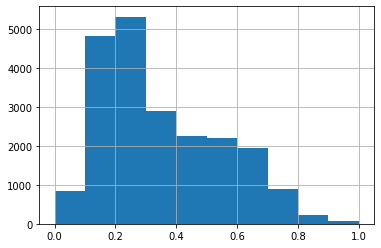

In [26]:
train_df['Target'].hist(); 
# Target value is skewed. The use of log transformation is usually advised for this kind of scenarios

Ghsl pop density > 500:  1178


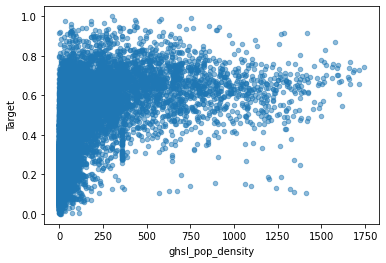

In [47]:
train_df.plot.scatter(x='ghsl_pop_density', y='Target', alpha=0.5);

In [52]:
pop_density = train_df['ghsl_pop_density']
count = pop_density[pop_density < 500].count()
print('w/ghsl pop density < 500: %d, %.3f percent' % (count, count/train_df.shape[0]*100))
print('w/ghsl pop density > 500: %d, %.3f percent' %(train_df.shape[0] - count, (train_df.shape[0] - count)/train_df.shape[0]*100))

w/ghsl pop density < 500: 20276, 94.509 percent
w/ghsl pop density > 500: 1178, 5.491 percent


An insight gained from plotting the relationship between *Target value* and *ghsl_pop_density* is that although higher (>500) ghsl_pop_density data make up only ~5% of data, they tend to have target values > 0.5.

Alternatively, when the the *dist_to_capital* parameter is >750, the target value tends to be lower than 0.5. The plot below visualizes this. 

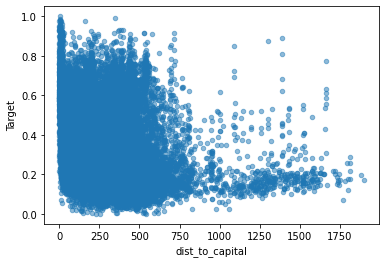

In [46]:
train_df.plot.scatter(x='dist_to_capital', y='Target', alpha=0.5);

In [54]:
# capital_dist = train_df['dist_to_capital']
count = train_df['dist_to_capital'][train_df['dist_to_capital'] < 750].count()
print('Distance to capital < 750: %d, %.3f percent' % (count, count/train_df.shape[0]*100))
print('w/ghsl pop density > 750: %d, %.3f percent' %(train_df.shape[0] - count, (train_df.shape[0] - count)/train_df.shape[0]*100))

Distance to capital < 750: 20746, 96.700 percent
w/ghsl pop density > 750: 708, 3.300 percent


Although we do not see a trend here in the data, we do get some insight from the data. **While target output is more concentrated in locations closet to the capital and with high population density, it is quite sparse as we move further away from capital. Additionally, the data is more representative of places with population desnsity < 500**.

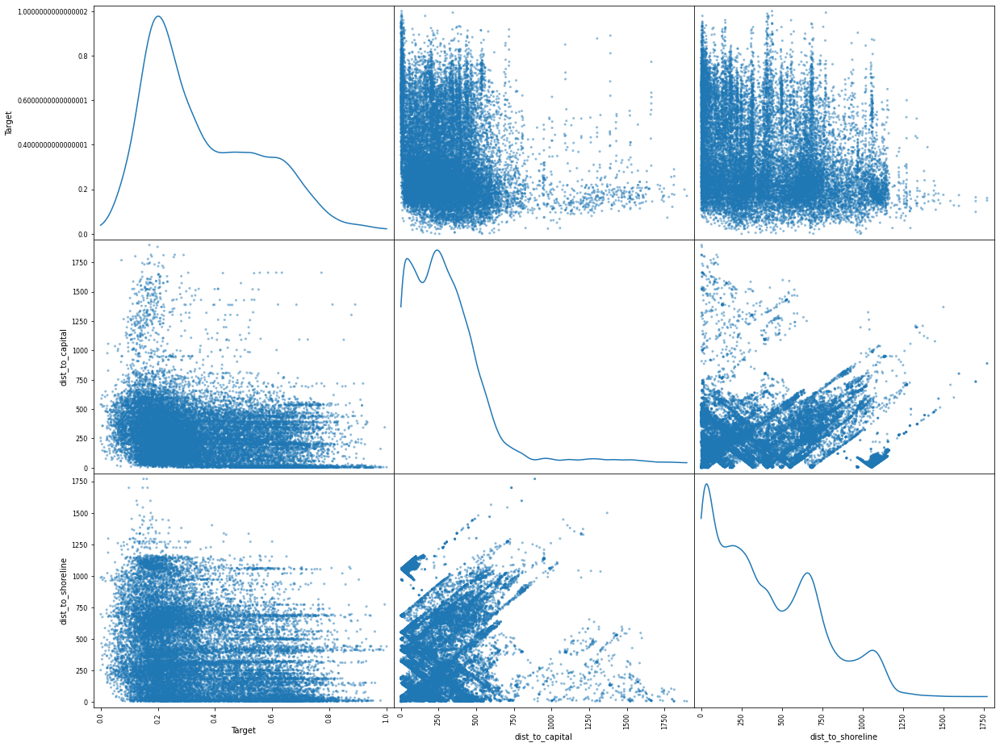

In [33]:
attrs = ['Target', 'dist_to_capital', 'dist_to_shoreline', 'country']
_ = pd.plotting.scatter_matrix(train_df[attrs], figsize=(20,16), diagonal='kde')

As you might have guessed, places that emit more light tend to be wealthier, but there is a lot of variation.

We can also look at categorical columns like 'country' or 'urban_vs_rural' and see the distribution of the target for each group:

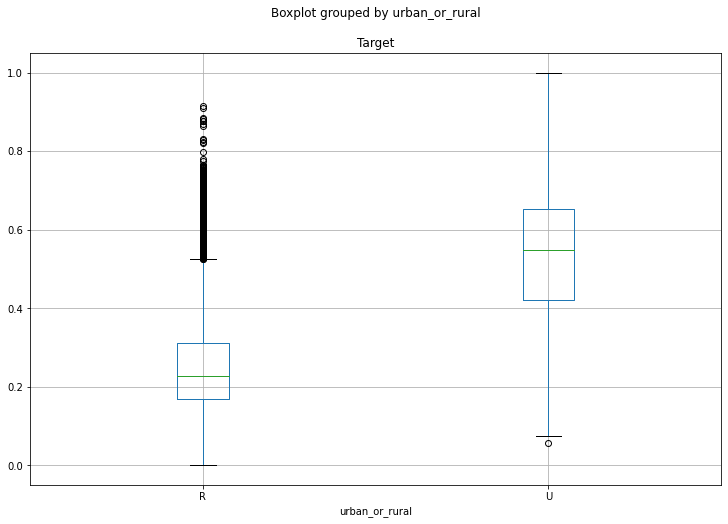

In [60]:
# Looking at the wealth distribution for urban vs rural
train_df.boxplot(by='urban_or_rural', column='Target', figsize=(12, 8));

In [71]:
# Exercise: which is the country with the higest average wealth_index according to this dataset?
mean_target_by_country = train_df.groupby('country')['Target'].mean()
print(mean_target_by_country.idxmax(), end = " ")
print(mean_target_by_country[mean_target_by_country.idxmax()])

Swaziland 0.4993463748634879


## Encoding & Feature Engineering

Encoding some class/binary features using frequency counter

In [72]:
# Turning a categorical column into a numeric feature
train_df['is_urban'] = (train_df['urban_or_rural'] == 'U').astype(int)
test_df['is_urban'] = (test_df['urban_or_rural'] == 'U').astype(int)
train_df.head()

,ID,country,year,urban_or_rural,ghsl_water_surface,ghsl_built_pre_1975,ghsl_built_1975_to_1990,ghsl_built_1990_to_2000,ghsl_built_2000_to_2014,ghsl_not_built_up,...,landcover_crops_fraction,landcover_urban_fraction,landcover_water_permanent_10km_fraction,landcover_water_seasonal_10km_fraction,nighttime_lights,dist_to_capital,dist_to_shoreline,Target,Target bin,is_urban
0,ID_AAIethGy,Ethiopia,2016,R,0.0,0.000000,0.000000,0.000055,0.000536,0.999408,...,25.489659,0.879484,0.000000,0.000000,0.000000,278.788451,769.338378,0.132783,0.25,0
1,ID_AAYiaCeL,Ethiopia,2005,R,0.0,0.000000,0.000110,0.000000,0.000018,0.999872,...,64.136053,0.601427,0.000000,0.005427,0.000000,200.986978,337.135243,0.004898,0.25,0
2,ID_AAdurmKj,Mozambique,2009,R,0.0,0.000000,0.000000,0.000000,0.000000,1.000000,...,4.400096,0.131900,0.000000,0.003078,0.000000,642.594208,169.913773,0.097320,0.25,0
3,ID_AAgNHles,Malawi,2015,R,0.0,0.000141,0.000181,0.000254,0.000228,0.999195,...,25.379371,2.017136,11.293841,0.131035,0.000000,365.349451,613.591610,0.304107,0.50,0
4,ID_AAishfND,Guinea,2012,U,0.0,0.011649,0.017560,0.017383,0.099875,0.853533,...,5.081620,22.815984,0.005047,0.130475,1.461894,222.867189,192.926363,0.605328,0.75,1


We can also normalize the values of the feautres as most of them are skewed

In [73]:
for df in (train_df, test_df):
    df['ghsl_built'] = df['ghsl_built_pre_1975'] + df['ghsl_built_1975_to_1990'] + \
                       df['ghsl_built_1990_to_2000'] + df['ghsl_built_2000_to_2014']
for df in (train_df, test_df):
    df['landcover_water'] = df['landcover_water_permanent_10km_fraction'] +  \
                       df['landcover_water_seasonal_10km_fraction'] 
train_df.head()

,ID,country,year,urban_or_rural,ghsl_water_surface,ghsl_built_pre_1975,ghsl_built_1975_to_1990,ghsl_built_1990_to_2000,ghsl_built_2000_to_2014,ghsl_not_built_up,...,landcover_water_permanent_10km_fraction,landcover_water_seasonal_10km_fraction,nighttime_lights,dist_to_capital,dist_to_shoreline,Target,Target bin,is_urban,ghsl_built,landcover_water
0,ID_AAIethGy,Ethiopia,2016,R,0.0,0.000000,0.000000,0.000055,0.000536,0.999408,...,0.000000,0.000000,0.000000,278.788451,769.338378,0.132783,0.25,0,0.000592,0.000000
1,ID_AAYiaCeL,Ethiopia,2005,R,0.0,0.000000,0.000110,0.000000,0.000018,0.999872,...,0.000000,0.005427,0.000000,200.986978,337.135243,0.004898,0.25,0,0.000128,0.005427
2,ID_AAdurmKj,Mozambique,2009,R,0.0,0.000000,0.000000,0.000000,0.000000,1.000000,...,0.000000,0.003078,0.000000,642.594208,169.913773,0.097320,0.25,0,0.000000,0.003078
3,ID_AAgNHles,Malawi,2015,R,0.0,0.000141,0.000181,0.000254,0.000228,0.999195,...,11.293841,0.131035,0.000000,365.349451,613.591610,0.304107,0.50,0,0.000805,11.424876
4,ID_AAishfND,Guinea,2012,U,0.0,0.011649,0.017560,0.017383,0.099875,0.853533,...,0.005047,0.130475,1.461894,222.867189,192.926363,0.605328,0.75,1,0.146467,0.135523


In [77]:
# Frequency encoding for certain fetaures like country, year and urban/rural
for df in (train_df, test_df):
    country_freq = (df.groupby('country').size()) / len(df)
    year_freq = (df.groupby('year').size()) / len(df)
    urb_rural_freq = (df.groupby('urban_or_rural').size()) / len(df)

    df['country_freq'] = df['country'].apply(lambda x: country_freq[x])
    df['year_freq'] = df['year'].apply(lambda x: year_freq[x])
    df['urb_rural_freq'] = df['urban_or_rural'].apply(lambda x: urb_rural_freq[x])

In [79]:
train_df.head()

,ID,country,year,urban_or_rural,ghsl_water_surface,ghsl_built_pre_1975,ghsl_built_1975_to_1990,ghsl_built_1990_to_2000,ghsl_built_2000_to_2014,ghsl_not_built_up,...,nighttime_lights,dist_to_capital,dist_to_shoreline,Target,is_urban,ghsl_built,landcover_water,country_freq,year_freq,urb_rural_freq
0,ID_AAIethGy,Ethiopia,2016,R,0.0,0.000000,0.000000,0.000055,0.000536,0.999408,...,0.000000,278.788451,769.338378,0.132783,0,0.000592,0.000000,0.080218,0.056959,0.655402
1,ID_AAYiaCeL,Ethiopia,2005,R,0.0,0.000000,0.000110,0.000000,0.000018,0.999872,...,0.000000,200.986978,337.135243,0.004898,0,0.000128,0.005427,0.080218,0.029878,0.655402
2,ID_AAdurmKj,Mozambique,2009,R,0.0,0.000000,0.000000,0.000000,0.000000,1.000000,...,0.000000,642.594208,169.913773,0.097320,0,0.000000,0.003078,0.040971,0.046052,0.655402
3,ID_AAgNHles,Malawi,2015,R,0.0,0.000141,0.000181,0.000254,0.000228,0.999195,...,0.000000,365.349451,613.591610,0.304107,0,0.000805,11.424876,0.091218,0.098024,0.655402
4,ID_AAishfND,Guinea,2012,U,0.0,0.011649,0.017560,0.017383,0.099875,0.853533,...,1.461894,222.867189,192.926363,0.605328,1,0.146467,0.135523,0.027641,0.073972,0.344598


In [80]:
test_df.head()

,ID,country,year,urban_or_rural,ghsl_water_surface,ghsl_built_pre_1975,ghsl_built_1975_to_1990,ghsl_built_1990_to_2000,ghsl_built_2000_to_2014,ghsl_not_built_up,...,landcover_water_seasonal_10km_fraction,nighttime_lights,dist_to_capital,dist_to_shoreline,is_urban,ghsl_built,landcover_water,country_freq,year_freq,urb_rural_freq
0,ID_AAcismbB,Democratic Republic of Congo,2007,R,0.000000,0.000000,0.000000,0.000523,0.000131,0.999347,...,0.032627,0.000000,1249.294720,1364.592100,0,0.000653,0.101681,0.109119,0.085071,0.641229
1,ID_AAeBMsji,Democratic Republic of Congo,2007,U,0.000000,0.004239,0.000238,0.001227,0.002860,0.991437,...,0.000000,0.000000,821.019579,1046.028681,1,0.008563,0.000000,0.109119,0.085071,0.358771
2,ID_AAjFMjzy,Uganda,2011,U,0.007359,0.525682,0.132795,0.095416,0.042375,0.196373,...,3.950374,60.070041,3.620455,906.057334,1,0.796268,7.198857,0.220183,0.188212,0.358771
3,ID_AAmMOEEC,Burkina Faso,2010,U,0.000000,0.000089,0.000036,0.001519,0.001358,0.996997,...,0.130727,1.333999,109.493969,775.139189,1,0.003003,0.130727,0.138588,0.105783,0.358771
4,ID_ABguzDxp,Zambia,2007,R,0.000000,0.000138,0.000623,0.000615,0.002961,0.995663,...,0.128997,0.502203,133.643319,835.591501,0,0.004337,0.262560,0.144287,0.085071,0.641229


In [82]:
train_df.columns

Index(['ID', 'country', 'year', 'urban_or_rural', 'ghsl_water_surface',
       'ghsl_built_pre_1975', 'ghsl_built_1975_to_1990',
       'ghsl_built_1990_to_2000', 'ghsl_built_2000_to_2014',
       'ghsl_not_built_up', 'ghsl_pop_density', 'landcover_crops_fraction',
       'landcover_urban_fraction', 'landcover_water_permanent_10km_fraction',
       'landcover_water_seasonal_10km_fraction', 'nighttime_lights',
       'dist_to_capital', 'dist_to_shoreline', 'Target', 'is_urban',
       'ghsl_built', 'landcover_water', 'country_freq', 'year_freq',
       'urb_rural_freq'],
      dtype='object')

# Modelling

We've had a look at our data and it looks good! Let's see if we can create a model to predict the Target given some of our inputs. To start with we will use only the numeric columns, so that we can fit a model right away. 

In [85]:
in_cols = ['ghsl_water_surface', 'ghsl_not_built_up', 'ghsl_pop_density', \
           'landcover_crops_fraction', "landcover_urban_fraction", 'nighttime_lights', \
          'dist_to_capital', 'dist_to_shoreline', 'is_urban', 'ghsl_built', 'landcover_water',
          'country_freq', 'year_freq', 'urb_rural_freq']

Train-test split for model evaluation

In [86]:
from sklearn.model_selection import train_test_split

X, y = train_df[in_cols], train_df['Target']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=58) # Random state keeps the split consistent
print(X_train.shape, X_test.shape)

(17163, 14) (4291, 14)


In [104]:
model = RandomForestRegressor() # Create the model
model.fit(X_train, y_train) # Train it (this syntax looks the same for all sklearn models)
model.score(X_test, y_test) # Show a score

0.7822841293590951

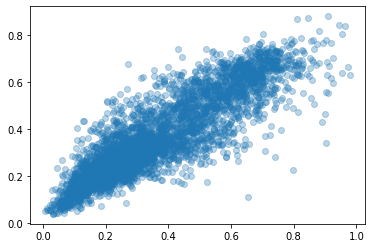

In [105]:
plt.scatter(y_test, model.predict(X_test), alpha=0.3);

This looks great - most predictions are nice and close to the true value! But we still don't have a way to link this to the leaderboard score on Zindi. Let's remedy that by calculating the Root Mean Squared Error, the same metric Zindi uses. 

In [106]:
from sklearn.metrics import mean_squared_error

# The `squared=False` bit tells this function to return the ROOT mean squared error
mean_squared_error(y_test, model.predict(X_test), squared=False)

0.09193892554577467

## Predicting test and submission 

In [93]:
# Copying our predictions into the submission dataframe - make sure the rows are in the same order!
ss = pd.read_csv('SampleSubmission.csv')
ss['Target'] = model.predict(test_df[in_cols]) 
ss.to_csv('first_submission.csv', index=False)
# ss.head()

,ID,Target
0,ID_AAcismbB,0.165201
1,ID_AAeBMsji,0.257516
2,ID_AAjFMjzy,0.765217
3,ID_AAmMOEEC,0.409879
4,ID_ABguzDxp,0.308846


# Getting Better

You might have noticed that your score on Zindi wasn't as good as the one you got above. This is because the test set comes from different countries to the train set. When we did a random split, we ended up with our local train and test both coming from the same countries - and it's easier for a model to extrapolate within countries than it is for it to make predictions for a new location. 

So our first step might be to make a scoring function that splits the data according to country, and measures the model performance on unseen countries. Try it and share your testing methods in the discussions. And look at the following questions:
- Does your score drop when you score your model on countries it wasn't trained with?
- Does the new score more accurately match the leaderboard score?
- Are any countries particularly 'hard' to make predictions in?

Knowing how well our model is doing is useful, but however you measure that we also need ways to improve this performance! There are a few ways to do this:

- Feed the model better data. How? Feature engineering! If we can add meaningful features the model will have more data to work with.
- Tune your models. We used the default parameters - perhaps we can tweak some hyperparameters to make our models better
- Try fancier models. Perhaps XGBoost or a neural network is better than Random Forest at this task

Let's do a little of each. First up, let's create a numeric feature that encodes the 'urban_or_rural' column as something the model can use:


Note that whenever we add features to train, *we also need to add them to test* otherwise we won't be able to make our predictions.

With this extra feature, we can fit a new model:

Did your score improve?

Next, let's tune our model by adjusting the maximum depth. This is one of many hyperparameters that can be tweaked on a Random Forest model. Here I just try a few randomly chosen values, but you could also use a grid search to try values more methodically.

In [94]:
xgb_model = xgb.XGBRegressor()
xgb_model.fit(X_train, y_train)
xgb_model.score(X_test, y_test)


0.7808878556987425

In [95]:
print('mse_error: ', mean_squared_error(y_test, xgb_model.predict(X_test), squared=False))

mse_error:  0.09223326958171739


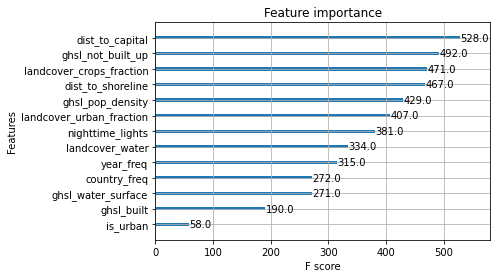

In [96]:
xgb.plot_importance(xgb_model);

## Hyperparameter Exploration

In [101]:
# fits and predicts with models with tuned params
def tune_models(xgb_models):
    results, names = [], []
    errors = []
    for name, model in xgb_models.items():
        model.fit(X_train, y_train)
        score = model.score(X_test, y_test)
        error = mean_squared_error(y_test, model.predict(X_test), squared=False)
        results.append(score)
        errors.append(error)
        names.append(name)
        print('%s > score: %.5f mse: %.5f' %(name, score, error))
    return (names, results, errors)

def plot_tune_models(names, results, x_label, y_label='score'):
    plt.plot(names, results)
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.show()

# 1. Exploring number of estimators (trees)
def ntrees_tuned_models():
    models = {}
    n_trees = [5, 10, 15, 25, 35, 50, 100, 150]
    for n in n_trees:
        models[str(n)] = xgb.XGBRegressor(n_estimators=n)
    return models

# 2. Exploring max_depth parameter
def max_depth_tuned_models():
    models = {}
    for depth in range(1, 11):
        models[str(depth)] = xgb.XGBRegressor(max_depth=depth)
    return models

# 3. Exploring learning parameter
def lr_tuned_models():
    models = {}
    for rate in [1e-4, 1e-3, 1e-2, 0.1, 1]:
        key = '%.4f' % rate
        models[key] = xgb.XGBRegressor(eta=rate)
    return models

5 > score: 0.70309 mse: 0.10737
10 > score: 0.76772 mse: 0.09496
15 > score: 0.77885 mse: 0.09266
25 > score: 0.78087 mse: 0.09224
35 > score: 0.78171 mse: 0.09206
50 > score: 0.78334 mse: 0.09172
100 > score: 0.78089 mse: 0.09223
150 > score: 0.77842 mse: 0.09275


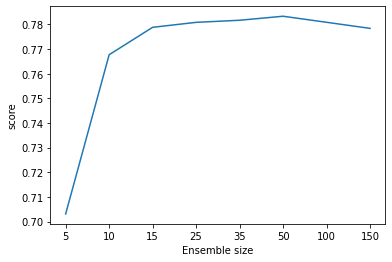

In [98]:
xgb_models = ntrees_tuned_models()
tree_tuned_names, tree_tuned_scores, tree_tuned_errs = tune_models(xgb_models)
plot_tune_models(tree_tuned_names, tree_tuned_scores, 'Ensemble size')

1 > score: 0.72832 mse: 0.10270
2 > score: 0.76961 mse: 0.09458
3 > score: 0.78148 mse: 0.09211
4 > score: 0.78400 mse: 0.09158
5 > score: 0.78798 mse: 0.09073
6 > score: 0.78089 mse: 0.09223
7 > score: 0.78358 mse: 0.09166
8 > score: 0.78394 mse: 0.09159
9 > score: 0.77511 mse: 0.09344
10 > score: 0.77294 mse: 0.09389


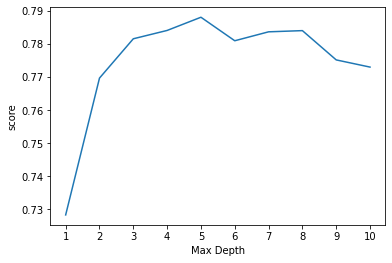

In [102]:
# Explore tree depth 
xgb_models = max_depth_tuned_models()
md_tuned_names, md_tuned_scores, md_tuned_errs = tune_models(xgb_models)
plot_tune_models(md_tuned_names, md_tuned_scores, 'Max Depth')

0.0001 > score: -0.53717 mse: 0.24430
0.0010 > score: -0.33255 mse: 0.22746
0.0100 > score: 0.55357 mse: 0.13165
0.1000 > score: 0.78892 mse: 0.09053
1.0000 > score: 0.69633 mse: 0.10858


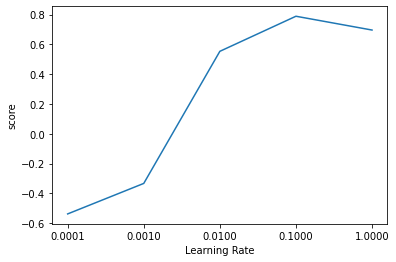

In [103]:
# Explore learning rate 
xgb_models = lr_tuned_models()
lr_tuned_names, lr_tuned_scores, lr_tuned_errs = tune_models(xgb_models)
plot_tune_models(lr_tuned_names, lr_tuned_scores, 'Learning Rate')